# Adrian Kamiński
## Praca domowa 1

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib

import pandas_profiling

import warnings
warnings.filterwarnings('ignore')

### Wczytujemy dane

In [2]:
forest_fires = pd.DataFrame(
    pd.read_json(path_or_buf = "https://api.apispreadsheets.com/api/dataset/forest-fires/", typ = 'table')
    .data
)
forest_fires

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00


### Sprawdzamy czy w zbiorze znajdują się braki i sprawdamy typy każdej z kolumn

In [3]:
forest_fires.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 52.6+ KB


Widzimy, że dane są komplentne.
Mamy 2 kolumny ze stringami, a pozostałe są liczbowe.
Możemy zamienić kolumny *month* i *day* na liczby (chociaż przy naszym zadaniu nie jest to konieczne).

In [4]:
def replace_with_int(df, column, ordering):
    df = df.copy()
    df[column] = df[column].apply(lambda x: ordering.index(x) + 1)
    return df

df = replace_with_int(forest_fires, 'month',
                     ordering=[
                         'jan',
                         'feb',
                         'mar',
                         'apr',
                         'may',
                         'jun',
                         'jul',
                         'aug',
                         'sep',
                         'oct',
                         'nov',
                         'dec'
                     ])
df = replace_with_int(df, 'day',
                     ordering=[
                         'sun',
                         'mon',
                         'tue',
                         'wed',
                         'thu',
                         'fri',
                         'sat'
        ])
df

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,3,6,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.00
1,7,4,10,3,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.00
2,7,4,10,7,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.00
3,8,6,3,6,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.00
4,8,6,3,1,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,8,1,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44
513,2,4,8,1,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29
514,7,4,8,1,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16
515,1,4,8,7,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00


Sprawdzamy wiele wartości statystycznych dla wszystkich kolumn na raz

In [5]:
df.describe()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,7.475822,3.972921,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,2.275990,2.143867,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,1.000000,1.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,7.000000,2.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,8.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,9.000000,6.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,12.000000,7.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


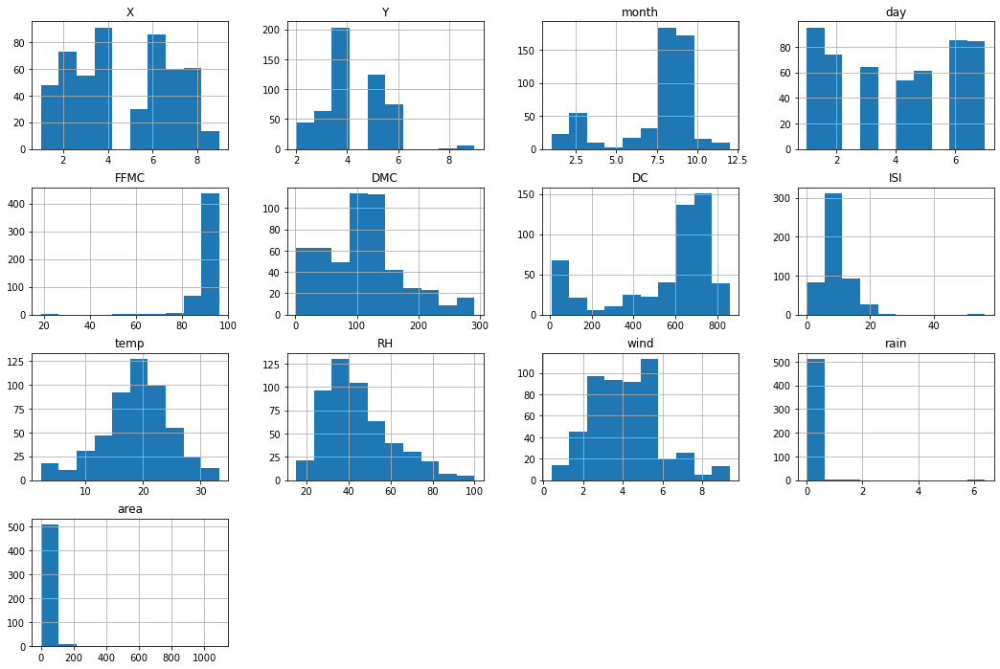

In [6]:
df.hist(figsize=(18, 12))

plt.show()

Historgramy te mogą pomóc w zauważeniu gdzie możemy szukać pewnych zależności.
Widać, że zależności mogą występować pomiedzy zmiennymi *DMC, DC, temp. RH, wind, ISI*

Widzimy też że zmienna *rain* charakteryzuję się małą wariancją (możliwe że warto zamienić tą kolumnę tak aby przyjmowała tylko wartosci 0 i 1)

## Sprawdźmy czy mieliśmy rację co do zależności

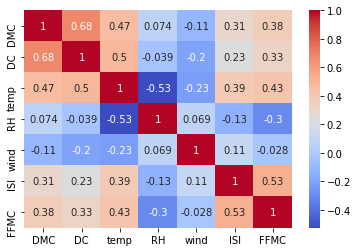

In [7]:
corrMatrix = df[['DMC', 'DC', 'temp', 'RH', 'wind', 'ISI', 'FFMC']].corr()

sns.heatmap(corrMatrix, annot=True, cmap = 'coolwarm')
plt.show()

Widzimy kilka zależności np. między: *RH* - *temp*, *FFMC* - *ISI* oraz *DC* - *DMC*

## Zajmijmy się zmienną *area*

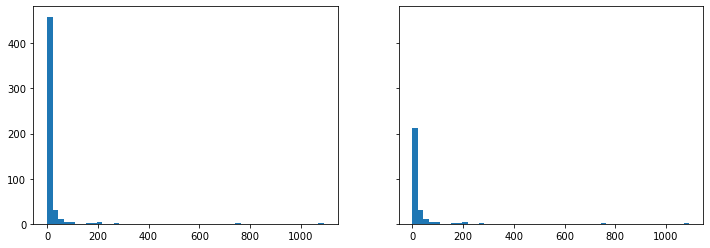

In [8]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharey = True, figsize = (12, 4))
ax1.hist(df.area, bins = 50)
ax2.hist(df.area[df.area > 0], bins = 50)
plt.show()

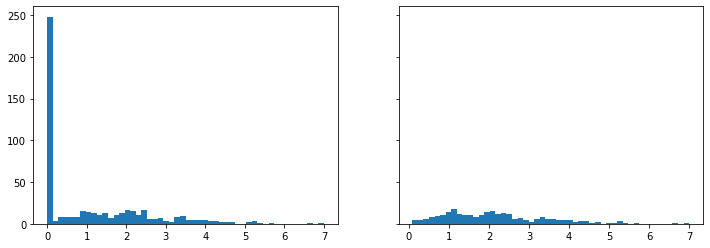

In [9]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharey = True, figsize = (12, 4))
ax1.hist(np.log1p(df.area), bins = 50)
ax2.hist(np.log1p(df.area[df.area > 0]), bins = 50)
plt.show()

Widzimy, że wiele obserwacji zawiera dane gdzie pożaru nie było czyli gdzie $area = 0$.
Analizując jednak miejsca gdzie pożary wybuchły widzimy i stosując skale logarytmiczną dostajemy rozkład przypominający rozkład normalny o dużej wariancji.

## Sprawdźmy teraz miejsca w których pożary występują i jakiego rozmiaru one są

Najpierw dodamy zmienną informująco czy pożar wystąpił czy nie

In [10]:
df['fire'] = pd.Series([0 if x == 0 else 1 for x in df.area])

In [11]:
x = df.groupby(by = ['X', 'Y'], as_index=False)['area', 'fire'].agg({'area':'mean', 'fire':'sum'})

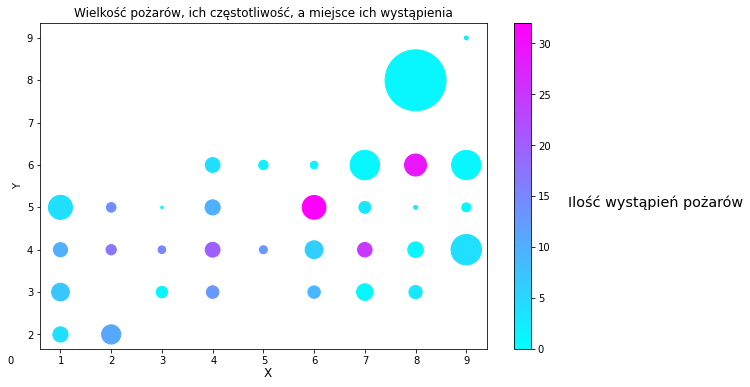

In [12]:
x.plot(kind='scatter', x='X', y='Y', s=20*x['area'], c = x['fire'], cmap = 'cool',figsize=(10,6))
plt.title("Wielkość pożarów, ich częstotliwość, a miejsce ich wystąpienia")
plt.text(x = 11, y = 5, s = 'Ilość wystąpień pożarów', fontsize = 'x-large')
plt.text(x = 5, y = 1, s = 'X', fontsize = 'large')
i=5
for i in range(10):
    plt.text(x = i- 0.05, y = 1.3, s = i)
    
plt.show()

Widzmy w szególności że są miejsca w których pożary nigdy nie występują, i jest też kilka miejsc gdzie pożary występują często (np. punkty $(6,5), (7,4), (8,6)$)

## Sprawdźmy czy miesiąc lub dzień ma jakikolwiek wpływ na pożary

In [13]:
x = df.groupby(by = 'day', as_index=False)['area', 'fire'].agg({'area':'mean', 'fire':'sum'})

In [14]:
def my_plot(x, col):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12,3))
    ax1.bar(x = x[col], height = x.area)
    ax2.bar(x = x[col], height = x.fire)

    ax1.set_xlabel(col)
    ax2.set_xlabel(col)

    ax1.set_ylabel("mean area")
    ax2.set_ylabel("number of fires")

    plt.show()

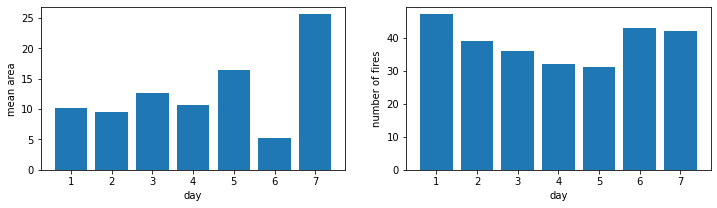

In [15]:
my_plot(x, "day")

In [16]:
x = df.groupby(by = 'month', as_index=False)['area', 'fire'].agg({'area':'mean', 'fire':'sum'})

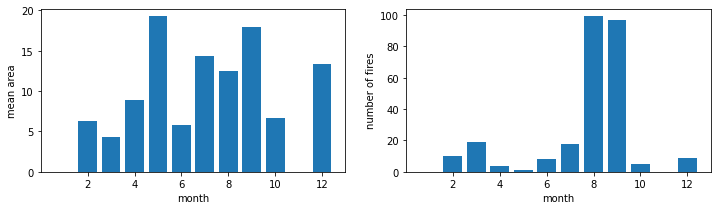

In [17]:
my_plot(x, "month")

Przy podziale na dni widzimy, że od piątku do poniedziału występuje nieznacznie więcej pożarów.
Jeśli chodzi o miesiące to ilość pożarów w sierpniu i wrześniu jest zdecydowanie największa choć nie wpływa to znacznie na obszar

## Sprawdźmy teraz zależność *area* od pozostałych zmiennych stosując pairplot'a

In [18]:
df.columns

Index(['X', 'Y', 'month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH',
       'wind', 'rain', 'area', 'fire'],
      dtype='object')

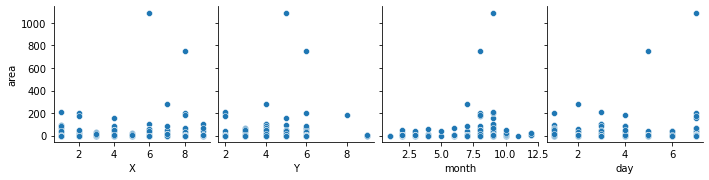

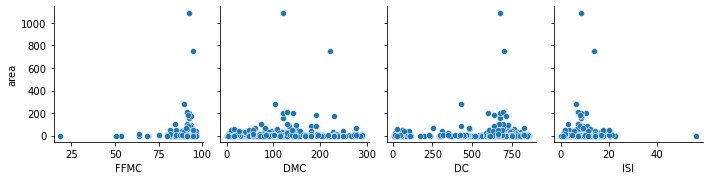

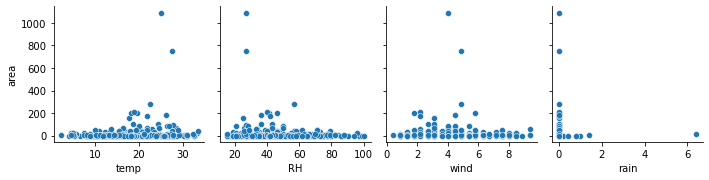

In [19]:
sns.pairplot(df, y_vars="area", x_vars=df.columns.values[:4], diag_kind=None)
sns.pairplot(df, y_vars="area", x_vars=df.columns.values[4:8], diag_kind=None)
sns.pairplot(df, y_vars="area", x_vars=df.columns.values[8:12], diag_kind=None)

plt.show()

## Użycie narzędzia do automatycznej eksploracji danych - *pandas-profiling*

In [20]:
forest_fires.profile_report()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Zalety:**
- informuje o brakach danych, ale również o powtórzonych wierszach, a także o kolumnach w których większość wartości jest taka sama
- możliwość tworzenia scatter plot'ów dla dowolnych dwóch zmiennych
- część *Correlations* jest przydatna i nie widzę żadnych sytuacji gdy wykresy te mogły by się nie przydać

**Wady:**
- brak możliwości zastosowania przekształceń na ramkach danych, nie możemy zastosować przekształcenia "w miejscu" musielibyśmy stworzyć cały raport na nowo z nową ramką danych
- w zakładce *Interactions* brak możliwości zmiany typu wykresu na np. ‘kde’, ‘hist’, ‘reg’